In [0]:
try:
  import tflearn # try to install tflearn
except ImportError:
  !pip3 install -q tflearn
  import tflearn

In [0]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tflearn.activations import relu # rectified linear activation function -- gets rid of all zeros

# normalizes data
from tflearn.layers.normalization import batch_normalization as bn
from scipy.misc import imread, bytescale, imresize # image manipulation functions
from tflearn.layers.core import input_data, dropout, fully_connected 
from tflearn.layers.conv import conv_2d, max_pool_2d, global_avg_pool # Convolutions
from tflearn.layers.estimator import regression # trainer for the network

# turns scalar label into vector where appropriate class is value 1 and others 0
from tflearn.data_utils import to_categorical

# makes new images from the ones we have by flipping them, rotating ect.
from tflearn.data_augmentation import ImageAugmentation

from tensorflow.contrib.tensorboard.plugins import projector

In [0]:
def install_tensorboard_dep():
  if 'ngrok-stable-linux-amd64.zip' not in os.listdir(os.getcwd()):
    !wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
    !unzip ngrok-stable-linux-amd64.zip
    os.system('n')

In [0]:
def montage(x, plot_shape=(15, 15), return_grid=False, cmap='viridis'):
  '''
  Takes in a 4-D tensor, x, of shape [NxHxWxC] and puts all of the images
  together in a single matrix to show as one image. If return_grid is True, 
  it will not show the matrix, but return it to be used in some other 
  operations.
  '''
  
  count = 0
  if not return_grid:
    scale = [0, 255]
  else:
    scale = [0, 1]
  
  
  if len(x.shape) == 4 and x.shape[-1] == 3:
    num, m, n, c = x.shape
  else:
    num, m, n = x.shape
    c = 1
    
  num = int(np.ceil(np.sqrt(num)))
  grid = np.zeros([num*m, num*n, c])
  
  if c == 1:
    grid = grid[..., 0]
  
  for i in range(num):
    for j in range(num):
      if count < x.shape[0]:
        if c == 1:
          grid[i*m:i*m+m, j*n:j*n+n] = bytescale(x[count, ...], 
                                                 low=scale[0], high=scale[1])
        else:
          grid[i*m:i*m+m, j*n:j*n+n, :] = bytescale(x[count, ...],
                                                    low=scale[0], high=scale[1])
        count += 1 
        
  if return_grid:
    return grid
  else:
    fig = plt.figure(figsize=plot_shape)
    a1 = fig.add_subplot(111)
    a1.set_xticks(np.arange(-0.5, num*n, n))
    a1.set_yticks(np.arange(-0.5, num*m, m))
    a1.set_yticklabels([])
    a1.set_xticklabels([])
    a1.imshow(grid, cmap=cmap)
    plt.show()

In [0]:
def start_tensorboard():
  LOG_DIR = '/tmp/tflearn_logs'
  get_ipython().system_raw('tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'.format(LOG_DIR))
  get_ipython().system_raw('./ngrok http 6006 &')
  ! curl -s http://localhost:4040/api/tunnels | python3 -c \
  "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

In [0]:
def viz_embedding(tensor, images, labels, shape):
  
  tb_dir = '/tmp/tflearn_logs'
  sess = tf.Session()
  sess.run(tensor.initializer)
  summary_writer = tf.summary.FileWriter(tb_dir)
  config = projector.ProjectorConfig()
  embedding = config.embeddings.add()
  embedding.tensor_name = tensor.name
  embedding.metadata_path = os.path.join(tb_dir, 'metadata.tsv')
  embedding.sprite.image_path = os.path.join(tb_dir, 'flowers.png') 
  embedding.sprite.single_image_dim.extend(shape)
  projector.visualize_embeddings(summary_writer, config)
  saver = tf.train.Saver([tensor])
  saver.save(sess, os.path.join(tb_dir, 'flowers.ckpt'), 1)
  
  image_grid = montage(images, return_grid=True)
  plt.imsave(os.path.join(tb_dir, 'flowers.png'), image_grid)
  
  with open(os.path.join(tb_dir, 'metadata.tsv'),'w') as f:
    f.write("Index\tLabel\n")
    for index,label in enumerate(labels):
      f.write("%d\t%d\n" % (index,label))
  f.close()

In [7]:
response = input("Do you want to train a network? (y/n)")
if response in ["Y", "y", "Yes", "yes"]:
  Train = True
else:
  Train = False

Do you want to train a network? (y/n)n


In [8]:
print(Train)

False


In [9]:
# import flower data set loader from tflearn
import tflearn.datasets.oxflower17 as oxflower17

# load the data in as X and the labels in as Y
X, Y = oxflower17.load_data(one_hot = True, resize_pics = (150, 150))

100.0% 60276736 / 60270631


('Succesfully downloaded', '17flowers.tgz', 60270631, 'bytes.')
File Extracted
Starting to parse images...
Parsing Done!


In [10]:
print(X.shape, Y.shape) # print the shapes of data and labels
print(Y[:10, ...]) # print the first 10 label vectors

(1360, 150, 150, 3) (1360, 17)
[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]


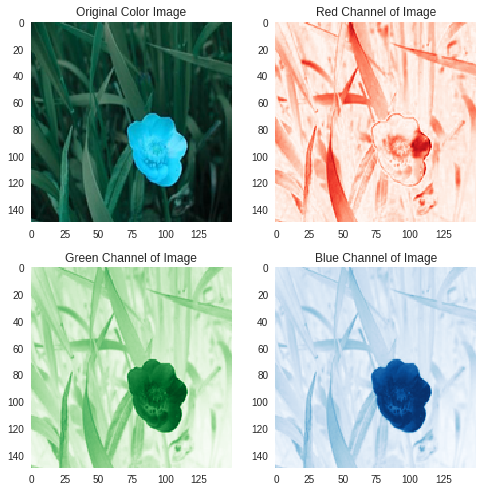

In [11]:
fig = plt.figure(figsize = (7,7)) # create a figure of size 7 x 7
a1 = fig.add_subplot(221)
a2 = fig.add_subplot(222)
a3 = fig.add_subplot(223)
a4 = fig.add_subplot(224)

x_show = X[0, :, :, ::-1] # get first image from the data set

a1.imshow(bytescale(x_show)) # show original image
a2.imshow(x_show[..., 0], cmap = 'Reds') # show the first color channel of the image
a3.imshow(x_show[..., 1], cmap = 'Greens') # show the second color channel of the image
a4.imshow(x_show[..., 2], cmap = 'Blues') # show the third color channel of the image

# removes tick lines in graph
a1.grid(False)
a2.grid(False)
a3.grid(False)
a4.grid(False)

a1.set_title('Original Color Image')
a2.set_title('Red Channel of Image')
a3.set_title('Green Channel of Image')
a4.set_title('Blue Channel of Image')

plt.tight_layout() # helps organize figure

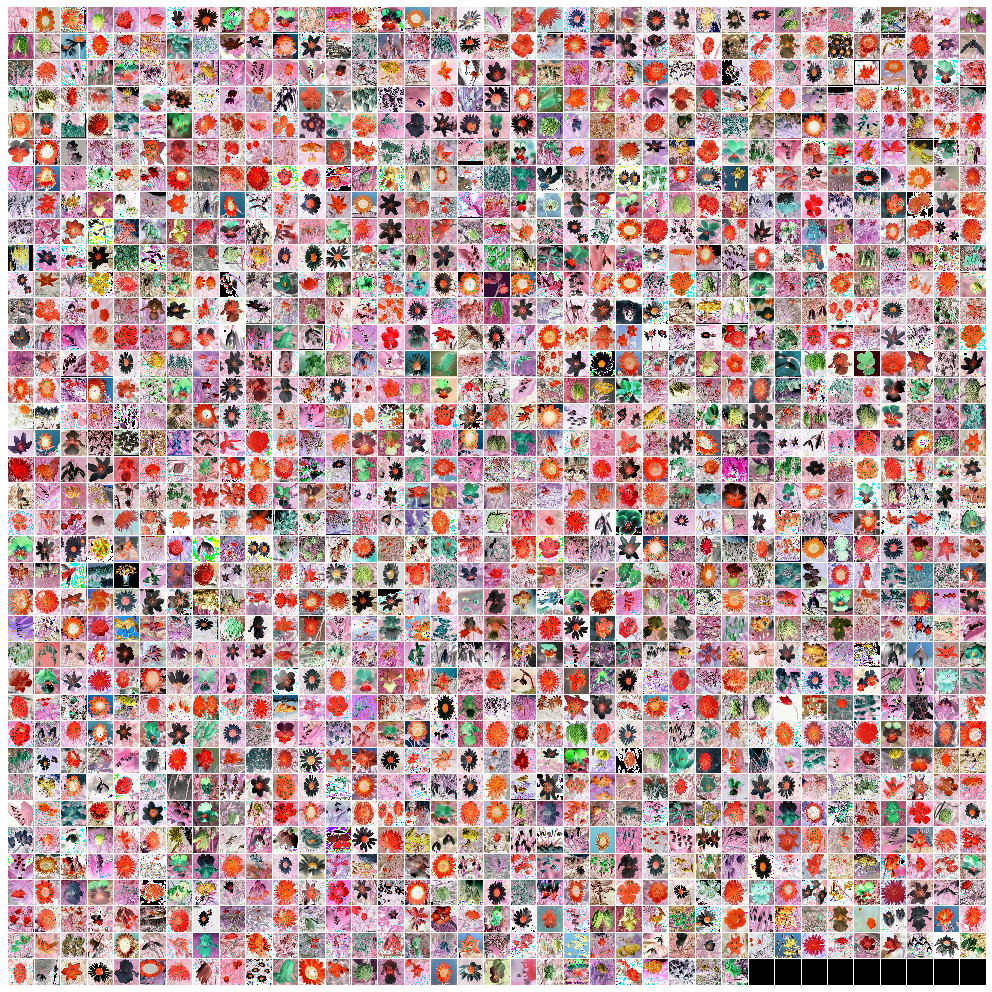

In [12]:
montage(X[..., ::-1], (18, 18))

In [0]:
random_img = X[100, ...] # take the 100th image from the dataset
weight_filter = np.random.randn(5, 5, 3) # make random weights
output_feature_map = np.zeros(random_img.shape) # creates an empty feature map

In [0]:
for i in range(random_img.shape[0]-5): # loop through rows
  for j in range(random_img.shape[0]-5): # loop through columns
    output_feature_map[i, j] = np.sum(weight_filter * random_img[i:i+5, j:j+5, :]) # weighted sum

In [0]:
output_feature_map = bytescale(output_feature_map)

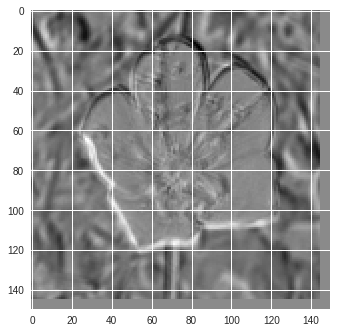

In [16]:
plt.imshow(output_feature_map, cmap = 'gray')

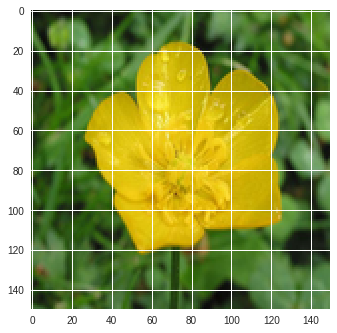

In [17]:
plt.imshow(random_img)

In [0]:
# makes negative values = to 0 and positive = to its value
output_feature_map = np.int32(output_feature_map > 0) * output_feature_map

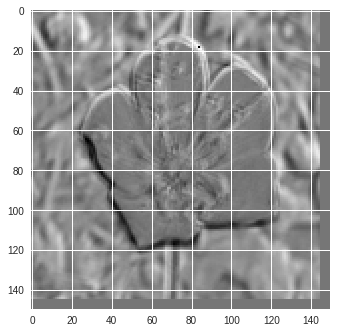

In [19]:
plt.imshow(np.float32(output_feature_map))

In [0]:
# preprocess data by subtracting mean and dividing by standard deviation
X -= np.mean(X, 0) # center each pixel value around 0
X /= np.std(X, 0) # squash each pixel value to between -1 and 1


(array([8.500000e+02, 5.138000e+03, 1.051000e+04, 2.470000e+04,
        4.701700e+04, 7.110800e+04, 9.616100e+04, 1.266000e+05,
        1.608510e+05, 2.050790e+05, 2.684030e+05, 3.692030e+05,
        5.376380e+05, 7.226730e+05, 9.138640e+05, 1.098724e+06,
        1.186555e+06, 1.318446e+06, 1.722883e+06, 2.431497e+06,
        3.097661e+06, 2.965128e+06, 2.831194e+06, 2.743201e+06,
        2.668486e+06, 2.606143e+06, 2.552061e+06, 2.489210e+06,
        2.438252e+06, 2.380084e+06, 2.328352e+06, 2.275114e+06,
        2.218941e+06, 2.155265e+06, 2.095430e+06, 2.036052e+06,
        1.981016e+06, 1.921051e+06, 1.863718e+06, 1.814738e+06,
        1.759510e+06, 1.701722e+06, 1.643042e+06, 1.590129e+06,
        1.539013e+06, 1.487755e+06, 1.440063e+06, 1.396610e+06,
        1.358049e+06, 1.313787e+06, 1.274289e+06, 1.231549e+06,
        1.187723e+06, 1.147274e+06, 1.104267e+06, 1.068367e+06,
        1.030875e+06, 9.920200e+05, 9.207120e+05, 8.449230e+05,
        7.750910e+05, 6.923480e+05, 6.37

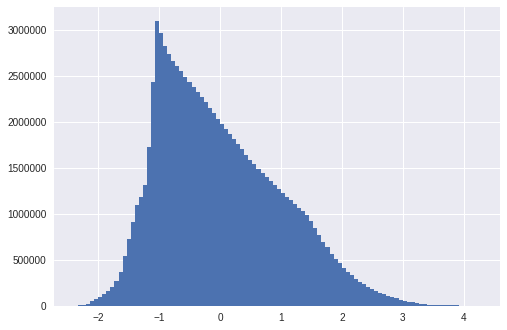

In [21]:
plt.hist(X.flatten(), bins = 100) # view histogram of normalized data

In [0]:
tf.reset_default_graph() # reset the tensorflow graph

In [0]:
# augment images
img_aug = ImageAugmentation()
img_aug.add_random_flip_leftright() # randomly flip some images left to right
img_aug.add_random_rotation(max_angle = 33.0) # randomly rotate images up to 33 degrees
img_aug.add_random_crop((150, 150), padding = 15) # randomly crop a 120 x 120 frame out of images

In [0]:
# creates a layer to view data space in tensorboard
emb = tf.Variable(X[::10, ...], name = 'input_flower_images')

In [25]:
# tflearn documentation --- http://tflearn.org/

# create input layer that takes in images and augments them as well
in_layer = input_data(shape = [None, 150, 150, 3], data_augmentation = img_aug)

# have 64, 7x7 filters slide over the image using a linear activation function and name it 'c1'
conv1 = conv_2d(in_layer, 64, 7, activation = 'linear', name = 'c1')

# normalize conv1 layer feature maps
batch_norm1 = bn(conv1, name = 'bn1')

# preform relu activation function
relu1 = relu(batch_norm1)

# max pooling --- look over 3 at a time, move over 2
pool1 = max_pool_2d(relu1, 3, 2)

# second conv layer with 128, 3x3 filters
conv2 = conv_2d(pool1, 128, 3, activation = 'linear', name = 'c2')

# normalize conv2 layer feature maps
batch_norm2 = bn(conv2, name = 'bn2')

# preform relu activation function
relu2 = relu(batch_norm2)

# max pooling --- look over 3 at a time, move over 2
pool2 = max_pool_2d(relu2, 3, 2)

# third conv layer with 256, 3x3 filters
conv3 = conv_2d(pool2, 256, 3, activation = 'linear', name = 'c3')

# normalize conv3 layer feature maps
batch_norm3 = bn(conv3, name = 'bn3')

# preform relu activation function --- 37 x 37 x 256
relu3 = relu(batch_norm3)

# take the verage of each of the 256 feature maps --- num_images x 1 x 1 x 256
gap = global_avg_pool(relu3)

# output layer --- softmax turns output values into probabilities
out_layer = fully_connected(gap, 17, activation = 'softmax', name = 'fc')

Instructions for updating:
Use tf.initializers.variance_scaling instead with distribution=uniform to get equivalent behavior.


In [26]:
# describe how to optimize the network's weights
network = regression(out_layer, optimizer = 'adam',
                    loss = 'categorical_crossentropy', learning_rate = .001)

Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [0]:
# build the network based on the description above
model = tflearn.DNN(network, tensorboard_verbose = 2)

In [0]:
import os

In [29]:
# name for tensorboard
tensorboard_name = 'flowers_cnn'
viz_embedding(emb, X[::10, ...], np.argmax(Y[::10, ...], 1), [150, 150, 3])

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'ImageAugmentation' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'dict' object has no attribute 'name'


In [30]:
# start tensorboard
install_tensorboard_dep()
start_tensorboard()

--2018-10-15 18:12:35--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 52.22.127.224, 52.207.111.186, 52.21.103.149, ...
Connecting to bin.equinox.io (bin.equinox.io)|52.22.127.224|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5363700 (5.1M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip’

ngrok-stable-linux- 100%[===================>]   5.11M  7.66MB/s    in 0.7s    

2018-10-15 18:12:36 (7.66 MB/s) - ‘ngrok-stable-linux-amd64.zip’ saved [5363700/5363700]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   
http://4ca2dbe3.ngrok.io


In [0]:
if Train:
  model.fit(X, # input data
            Y, # corrisponding labels
            n_epoch=50, # number of times to go through the entire data set
            shuffle = True,# shuffle the images each epoch
            validation_set = 0.1, # use 10% of the images for validation
            show_metric = True, # show validation accuracy/loss in tensorboard
            batch_size = 50, # go through the dataset 50 examples at a time
            run_id = 'OxfordFlowers_CNN') # name that will show up on tensorboard
  # saved the trained model for later as the name in red below
  model.save('flowers_CNN')

In [0]:
sess = tf.Session() # tensorflow session
sess.run(tf.global_variables_initializer())

In [0]:
def load_layer(layer_name, data):
  layer = sess.run(layer_name, {in_layer:data[None, ...]})
  print(layer.shape)
  return layer

In [0]:
def view_feature_map(layer):
  n, h, w, c = layer.shape # get layer's shape
  layer = layer.transpose((0, 3, 1, 2)).reshape([n*c, h, w])
  montage(layer, cmap = 'gray')
  

In [0]:
# choose 1 random number between 0 and the number of examples in the dataset
random_index = np.random.randint(0, X.shape[0], 1)[0]

# take out the image at that spot to use 
new_img = X[random_index, ...]

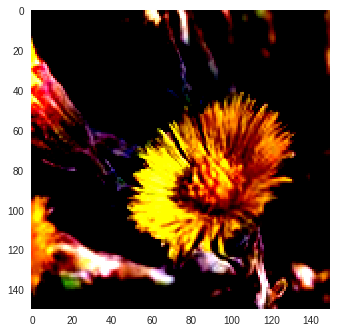

In [42]:
# view the original image
img_show = bytescale(new_img, 0, 1) # make values in new_img go between 0 and 1 to show it in matplotlib
plt.imshow(img_show)  # tell it what to show
plt.grid(False)  # get rid of the gridlines since this is not a graph
plt.show()  # show the image

(1, 150, 150, 64)


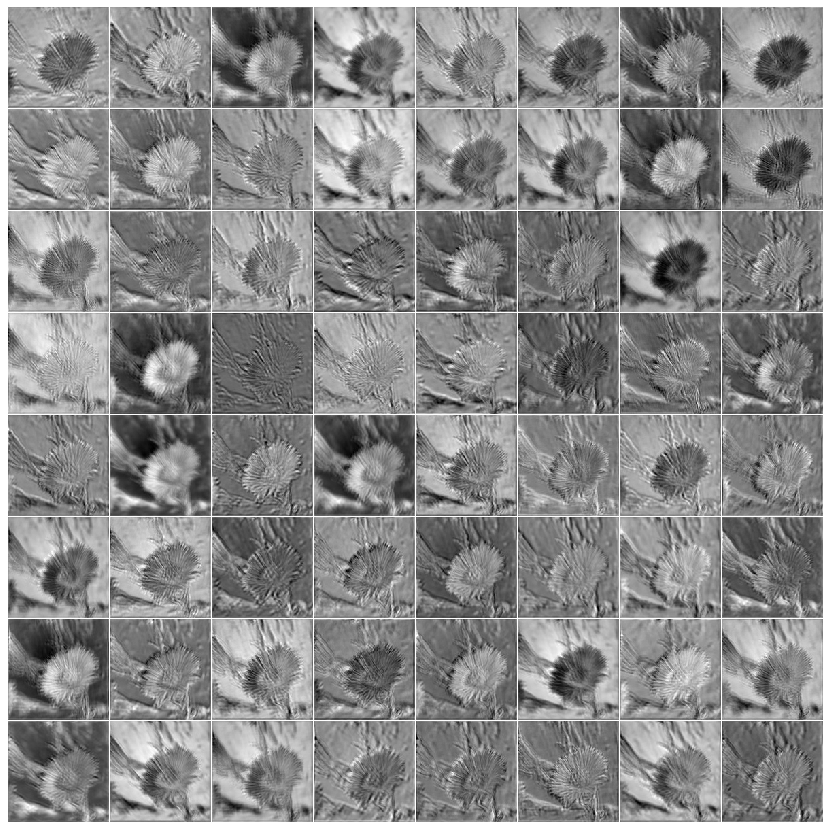

In [43]:
# view the first conv layer's feature maps --- 64 different views of the image to help decide what it is
view_feature_map(load_layer(conv1, new_img)) 

# This layer created many individually unique images out of the original image
# The convolution layer is different for each neuron depending on the filter the neuron is using, and the features it is detecting
# By creating multiple versions of the image, the convolution layer brings out defining features of an image making it easier to classify

(1, 150, 150, 64)


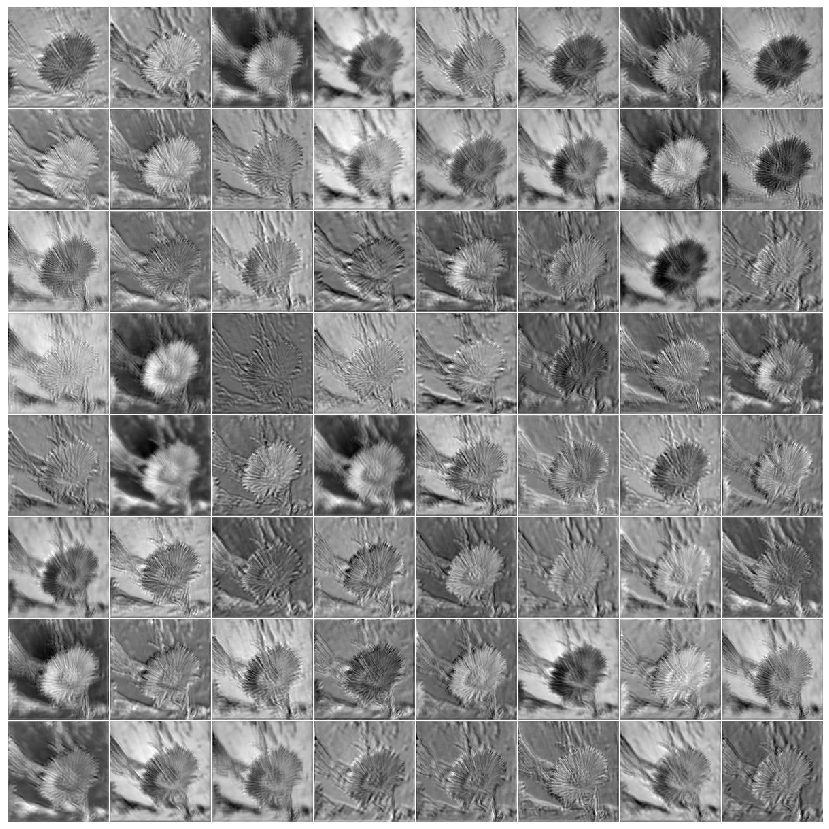

In [44]:

# view results of the normalization layer
view_feature_map(load_layer(batch_norm1, new_img)) 

# The batch normilazation layer normalized the data, bringing the individual pixel values closer to eachother
# Visually, this layer made the images smoother and reduced the amount of sharp edges and extreme contrasts
# By normalizing the data, the network will train more efficiently as there is a greater chance that the network will not get stuck on certian features of an image which may have an extreme changes in pixel value.

(1, 150, 150, 64)


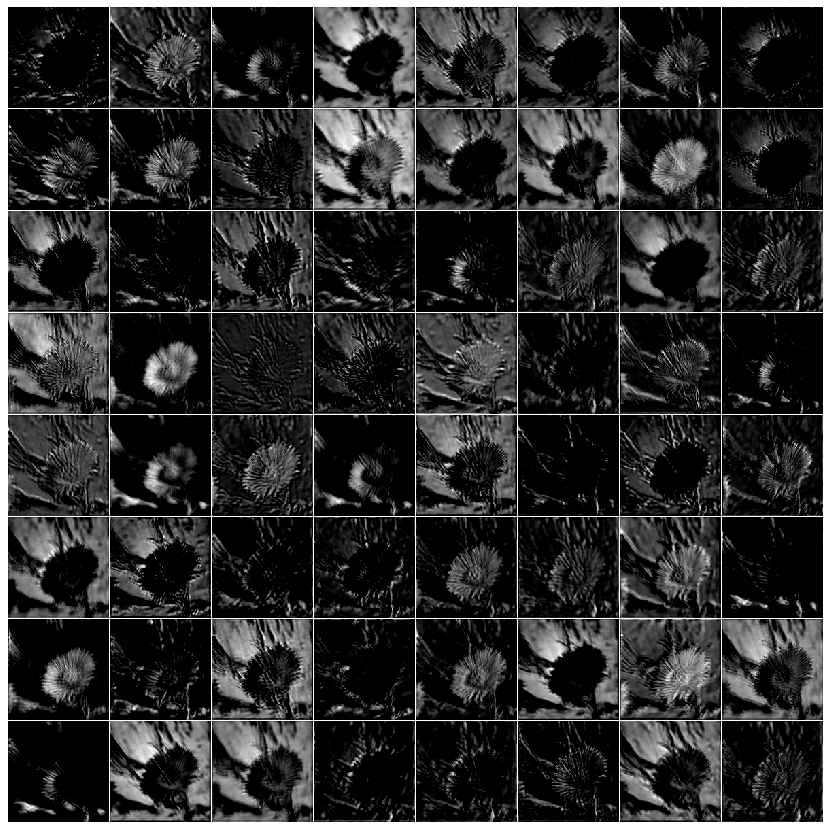

In [45]:
# view results of the rectified linear layer
view_feature_map(load_layer(relu1, new_img)) 

# This layer made the image visually darker as the relu function turned all negative values to 0, and in the gray scale 0 = complete absense of white (black) 
# By making all negitave values 0, positive values are brought out makeing more distinguishable features visible for the network

(1, 75, 75, 64)


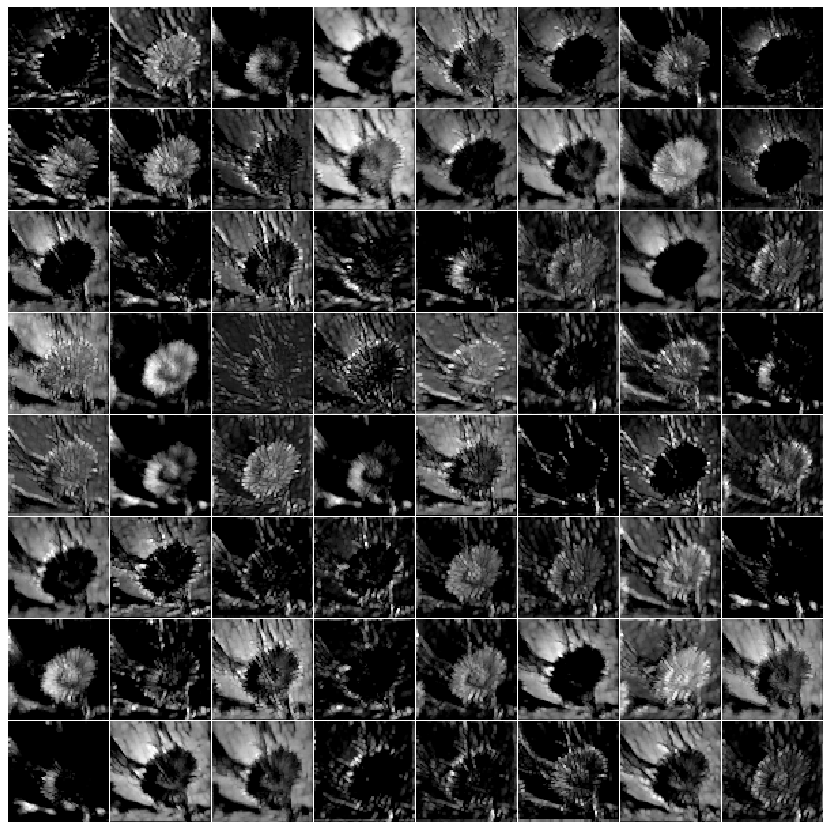

In [46]:
# view results of the pooling layer
view_feature_map(load_layer(pool1, new_img)) 

# This layer reduced the images dimentions by a scale of two while keeping all important features
# The pooling layer did this by max pooling with a stride of 2
# By reducing dimentionality, this layer made it more efficient for the network to train


HW 4 Part 1: Finish viewing the rest of the CNN layers in the network (i.e. conv2, batch_norm2, relu2, pool2, conv3, batch_norm3, relu3).

(1, 75, 75, 128)


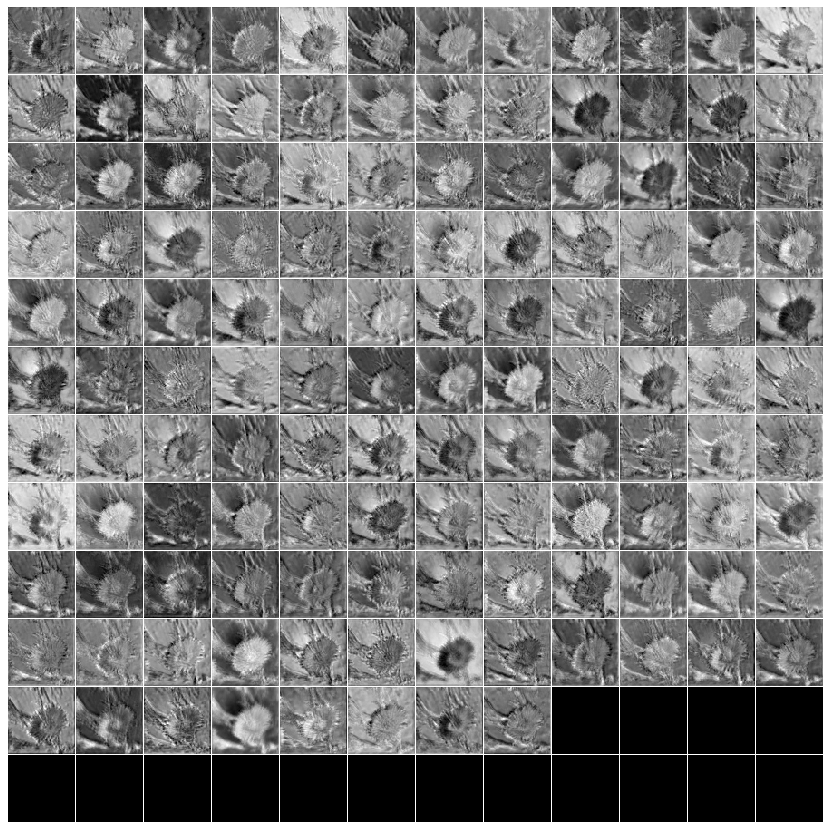

In [47]:
# view results of the conv2 layer
view_feature_map(load_layer(conv2, new_img))

# This layer created many individually unique images out of the original image
# The convolution layer is different for each neuron depending on the filter the neuron is using, and the features it is detecting
# By creating multiple versions of the image, the convolution layer brings out defining features of an image making it easier to classify

(1, 75, 75, 128)


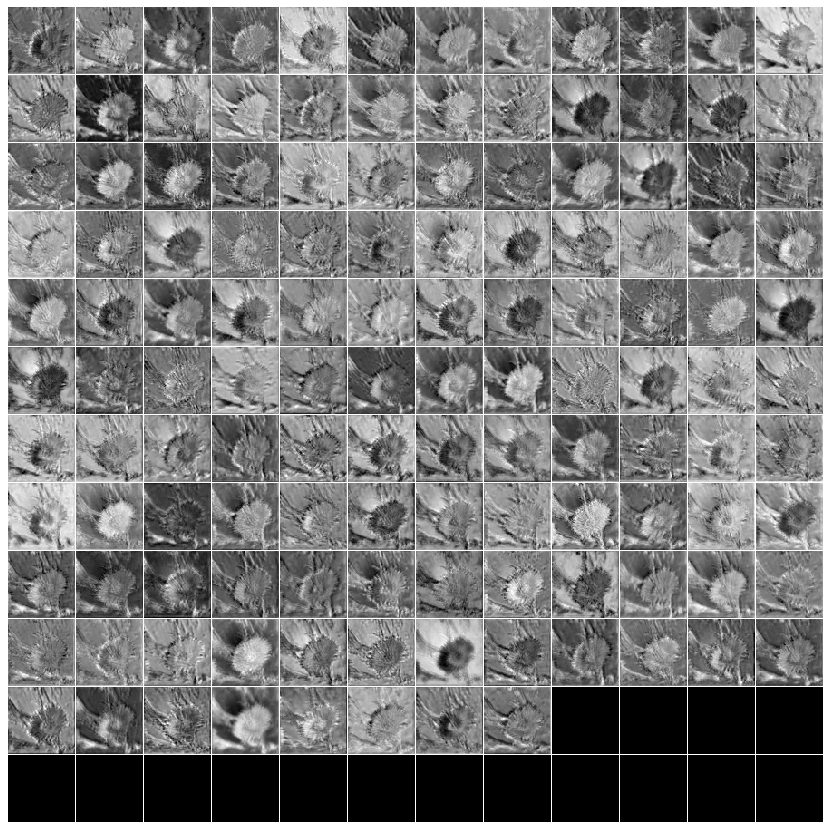

In [48]:
# view results of the batch_norm2 layer
view_feature_map(load_layer(batch_norm2, new_img))

# The batch normilazation layer normalized the data, bringing the individual pixel values closer to eachother
# Visually, this layer made the images smoother and reduced the amount of sharp edges and extreme contrasts
# By normalizing the data, the network will train more efficiently as there is a greater chance that the network will not get stuck on certian features of an image which may have an extreme changes in pixel value.

(1, 75, 75, 128)


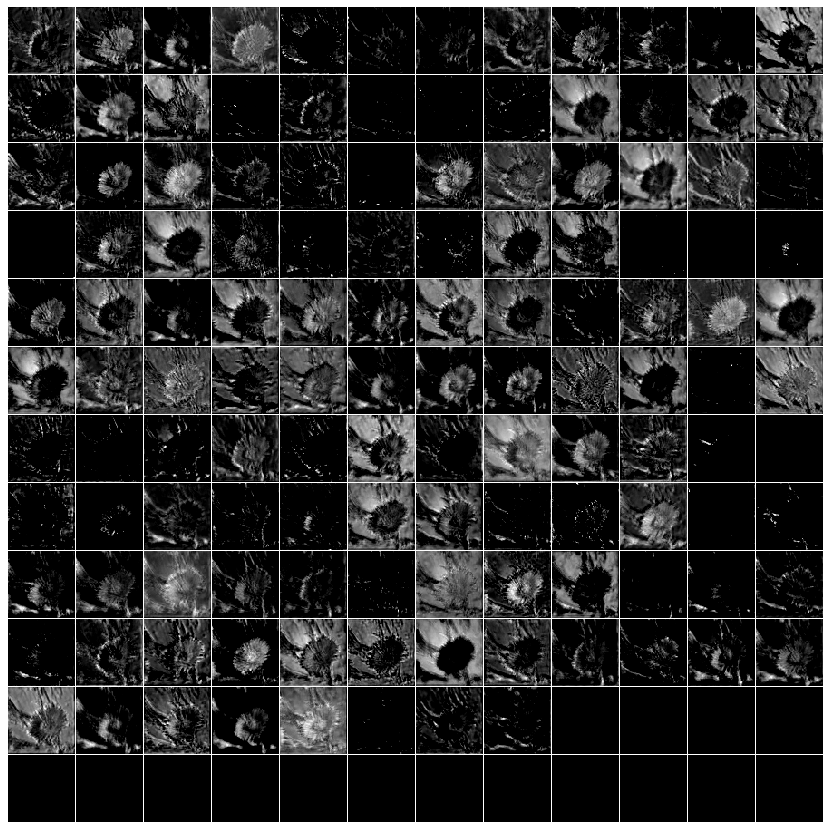

In [49]:
# view results of the relu2 layer
view_feature_map(load_layer(relu2, new_img))

# This layer made the image visually darker as the relu function turned all negative values to 0, and in the gray scale 0 = complete absense of white (black) 
# By making all negitave values 0, positive values are brought out makeing more distinguishable features visible for the network

(1, 38, 38, 128)


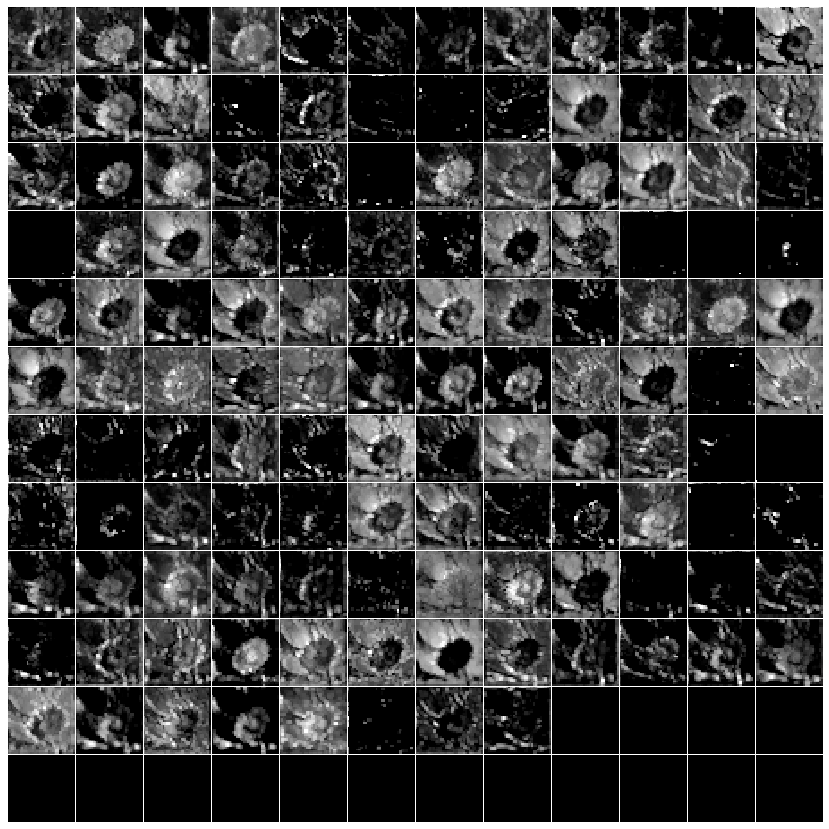

In [50]:
# view results of the pool2 layer
view_feature_map(load_layer(pool2, new_img))
# This layer reduced the images dimentions by a scale of two while keeping all important features
# The pooling layer did this by max pooling with a stride of 2
# By reducing dimentionality, this layer made it more efficient for the network to train

(1, 38, 38, 256)


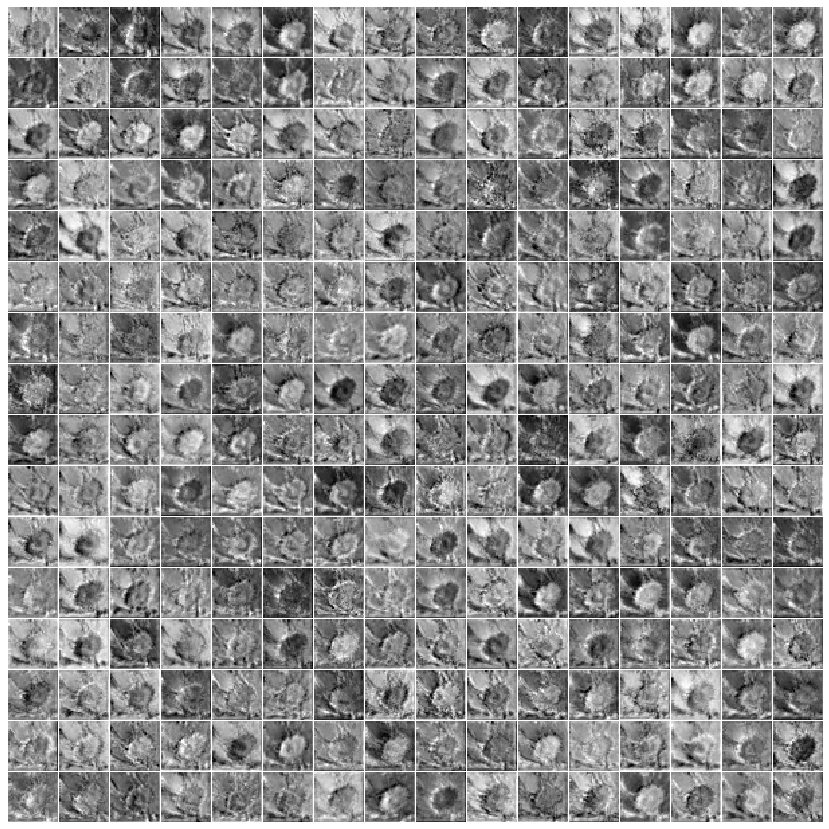

In [51]:
# view results of the conv3 layer
view_feature_map(load_layer(conv3, new_img))

# This layer created many individually unique images out of the original image
# The convolution layer is different for each neuron depending on the filter the neuron is using, and the features it is detecting
# By creating multiple versions of the image, the convolution layer brings out defining features of an image making it easier to classify

(1, 38, 38, 256)


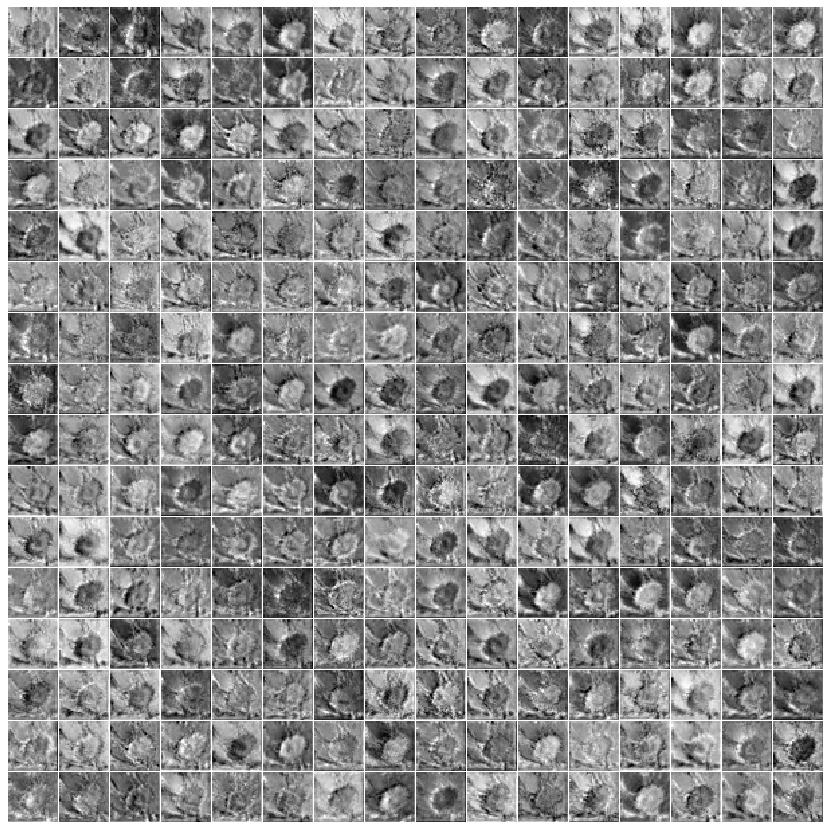

In [52]:
# view results of the batch_norm3 layer
view_feature_map(load_layer(batch_norm3, new_img))

# The batch normilazation layer normalized the data, bringing the individual pixel values closer to eachother
# Visually, this layer made the images smoother and reduced the amount of sharp edges and extreme contrasts
# By normalizing the data, the network will train more efficiently as there is a greater chance that the network will not get stuck on certian features of an image which may have an extreme changes in pixel value.

(1, 38, 38, 256)


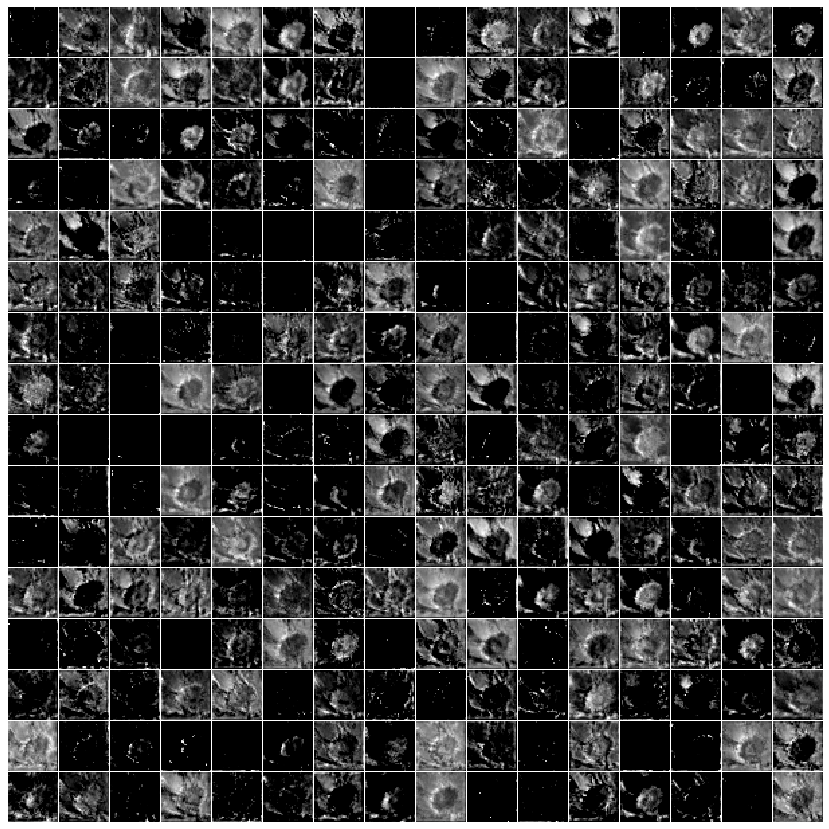

In [53]:
# view results of the relu3 layer
view_feature_map(load_layer(relu3, new_img))

# This layer made the image visually darker as the relu function turned all negative values to 0, and in the gray scale 0 = complete absense of white (black) 
# By making all negitave values 0, positive values are brought out makeing more distinguishable features visible for the network